In [1]:
import requests
import tarfile
import os

IMAGE_PATH = "VOCdevkit/VOC2007/JPEGImages"

if not os.path.isdir('data'):
  data = requests.get("http://host.robots.ox.ac.uk/pascal/VOC/voc2007/VOCtrainval_06-Nov-2007.tar")
  with open("data.tar", 'wb') as f:
      f.write(data.content) 

  tar = tarfile.open("data.tar")
  tar.extractall()
  tar.close()


In [7]:
import glob
import cv2
import matplotlib.pyplot as plt

from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, Callback
# from tensorflow.keras.applications import vgg19
from tensorflow.keras.applications import VGG16
from tensorflow.nn import depth_to_space

from tqdm import tqdm_notebook as tqdm

import numpy as np
import pandas as pd

In [2]:
path = 'VOCdevkit/VOC2007/JPEGImages/'

In [3]:
NUM_IMAGES = 5000
SPLIT_VAL = NUM_IMAGES//5 * 4

# Step 1

In [4]:
X=[]
y_mid = []
y_large = []

filelist = glob.glob(path+'*.jpg')

for f in tqdm(filelist[:NUM_IMAGES]):
    img = cv2.imread(f)/255.
    X.append(cv2.resize(img,(72,72)))
    y_mid.append(cv2.resize(img,(144,144)))
    y_large.append(cv2.resize(img,(288,288)))
    
X = np.array(X); y_mid = np.array(y_mid); y_large = np.array(y_large)
X.shape, y_mid.shape, y_large.shape

((5000, 72, 72, 3), (5000, 144, 144, 3), (5000, 288, 288, 3))

In [22]:
test_X=[]
test_y_mid = []
test_y_large = []

filelist = glob.glob(path+'*.jpg')

for f in tqdm(filelist[5000:]):
    img = cv2.imread(f)/255.
    test_X.append(cv2.resize(img,(72,72)))
    test_y_mid.append(cv2.resize(img,(144,144)))
    test_y_large.append(cv2.resize(img,(288,288)))
    
test_X = np.array(test_X); test_y_mid = np.array(test_y_mid); test_y_large = np.array(test_y_large)
test_X.shape, test_y_mid.shape, test_y_large.shape

((11, 72, 72, 3), (11, 144, 144, 3), (11, 288, 288, 3))

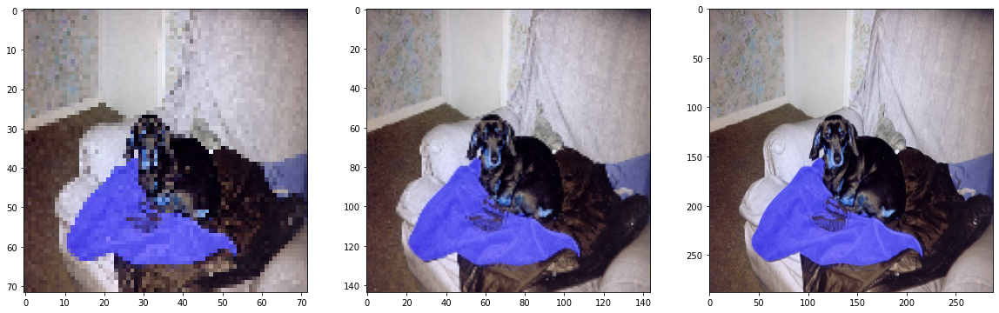

In [15]:
def plot_multiple_images(ind, X, y_mid, y_large):
    fig, ax = plt.subplots(1, 3, figsize=(20,6))
    ax[0].imshow(X[ind])
    ax[1].imshow(y_mid[ind])
    ax[2].imshow(y_large[ind])
    
plot_multiple_images(42, X, y_mid, y_large)

# Step 2

## Model v1 - Nearest UpSampling

In [6]:
def init_model_v1(input_shape):

    inp = Input(input_shape)
    X = Conv2D(64,3,activation='relu', padding='same')(inp)
    X = Conv2D(64,3,activation='relu', padding='same')(X)
    X = UpSampling2D(2)(X)
    out = Conv2D(3,1,activation='sigmoid', padding='same')(X)

    model = Model(inp, outputs=out)

    model.compile(optimizer='adam', loss='mse', metrics=['mae'])

    return model

In [7]:
model_v1 = init_model_v1(X.shape[1:])
model_v1.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 72, 72, 3)]       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 72, 72, 64)        1792      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 72, 72, 64)        36928     
_________________________________________________________________
up_sampling2d (UpSampling2D) (None, 144, 144, 64)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 144, 144, 3)       195       
Total params: 38,915
Trainable params: 38,915
Non-trainable params: 0
_________________________________________________________________


In [16]:
def get_callbacks(model_name):
    acc = 'val_loss'
    acc_mode = 'min'
    
    checkpoint = ModelCheckpoint(
                              fr'./models/{model_name}.h5', 
                              monitor=acc, 
#                               verbose=1, 
                              save_best_only=True, 
                              mode=acc_mode)
    earlystop = EarlyStopping(monitor=acc, mode=acc_mode, verbose=1, patience=4)
    reduceLR = ReduceLROnPlateau(monitor = 'val_loss', mode = 'min', patience = 3,
                            factor = 0.5, min_lr = 1e-6, verbose = 1)

    return [checkpoint, reduceLR, earlystop]

In [11]:
model_v1 = init_model_v1(X.shape[1:])
history = model_v1.fit(x=X[:SPLIT_VAL],
                    y=y_mid[:SPLIT_VAL],
                    epochs=50,
                    validation_data=(X[SPLIT_VAL:], y_mid[SPLIT_VAL:]),
                    callbacks=get_callbacks('model_v1')
                    )

Epoch 1/50
5/5 [==============================] - 0s 73ms/step - loss: 0.0769 - mae: 0.2352 - val_loss: 0.0733 - val_mae: 0.2298 - lr: 0.0010
Epoch 2/50
5/5 [==============================] - 0s 23ms/step - loss: 0.0701 - mae: 0.2243 - val_loss: 0.0658 - val_mae: 0.2173 - lr: 0.0010
Epoch 3/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0622 - mae: 0.2103 - val_loss: 0.0564 - val_mae: 0.2008 - lr: 0.0010
Epoch 4/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0521 - mae: 0.1918 - val_loss: 0.0445 - val_mae: 0.1771 - lr: 0.0010
Epoch 5/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0400 - mae: 0.1663 - val_loss: 0.0324 - val_mae: 0.1499 - lr: 0.0010
Epoch 6/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0282 - mae: 0.1371 - val_loss: 0.0215 - val_mae: 0.1191 - lr: 0.0010
Epoch 7/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0189 - mae: 0.1074 - val_loss: 0.0142 - val_mae: 0.0901 - lr: 0.0010
Epoch 

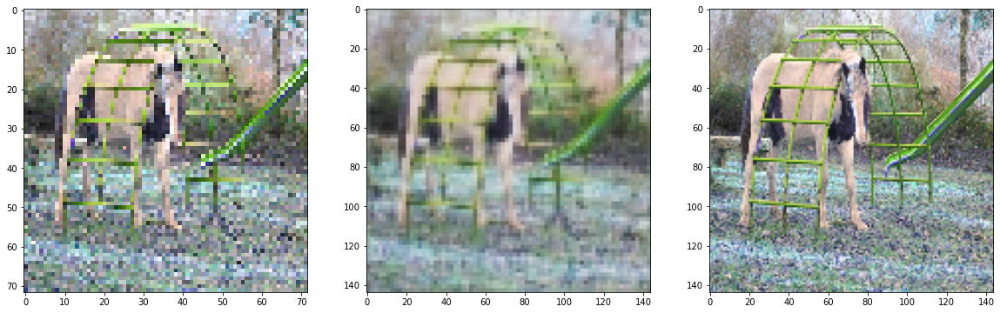

In [12]:
pred = model_v1.predict(X[SPLIT_VAL:])
plot_multiple_images(7, X[SPLIT_VAL:], pred, y_mid[SPLIT_VAL:])

## Model v2 - Bilinear UpSampling

In [14]:
def init_model_v2(input_shape):

    inp = Input(input_shape)
    X = Conv2D(64,3,activation='relu', padding='same')(inp)
    X = Conv2D(64,3,activation='relu', padding='same')(X)
    X = UpSampling2D(2, interpolation='bilinear')(X)
    out = Conv2D(3,1,activation='sigmoid', padding='same')(X)

    model = Model(inp, outputs=out)

    model.compile(optimizer='adam', loss='mse', metrics=['mae'])

    return model

In [15]:
model_v2 = init_model_v2(X.shape[1:])
history = model_v2.fit(x=X[:SPLIT_VAL],
                    y=y_mid[:SPLIT_VAL],
                    epochs=100,
                    validation_data=(X[SPLIT_VAL:], y_mid[SPLIT_VAL:]),
                    callbacks=get_callbacks('model_v2')
                    )

Epoch 1/100
5/5 [==============================] - 0s 50ms/step - loss: 0.0761 - mae: 0.2338 - val_loss: 0.0732 - val_mae: 0.2293 - lr: 0.0010
Epoch 2/100
5/5 [==============================] - 0s 31ms/step - loss: 0.0700 - mae: 0.2242 - val_loss: 0.0660 - val_mae: 0.2180 - lr: 0.0010
Epoch 3/100
5/5 [==============================] - 0s 28ms/step - loss: 0.0621 - mae: 0.2104 - val_loss: 0.0572 - val_mae: 0.2017 - lr: 0.0010
Epoch 4/100
5/5 [==============================] - 0s 30ms/step - loss: 0.0530 - mae: 0.1925 - val_loss: 0.0463 - val_mae: 0.1797 - lr: 0.0010
Epoch 5/100
5/5 [==============================] - 0s 27ms/step - loss: 0.0430 - mae: 0.1716 - val_loss: 0.0362 - val_mae: 0.1566 - lr: 0.0010
Epoch 6/100
5/5 [==============================] - 0s 27ms/step - loss: 0.0330 - mae: 0.1482 - val_loss: 0.0264 - val_mae: 0.1308 - lr: 0.0010
Epoch 7/100
5/5 [==============================] - 0s 28ms/step - loss: 0.0238 - mae: 0.1228 - val_loss: 0.0181 - val_mae: 0.1046 - lr: 0.0010

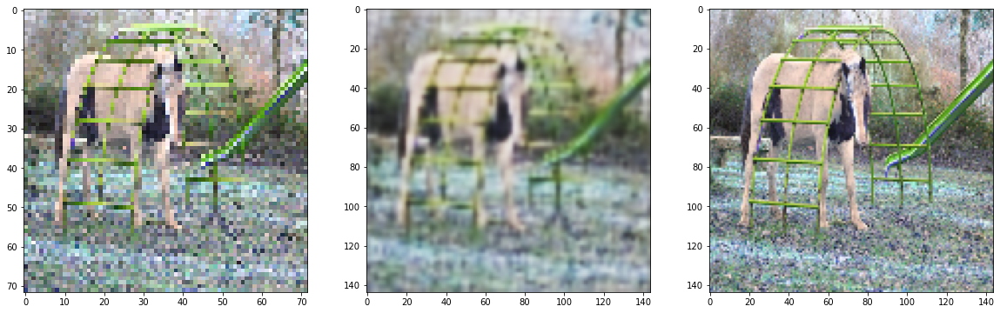

In [16]:
pred = model_v2.predict(X[SPLIT_VAL:])
plot_multiple_images(7, X[SPLIT_VAL:], pred, y_mid[SPLIT_VAL:])

# Step 3

## Model v3 - Extracting two levels

In [17]:
def init_model_v3(input_shape):

    inp = Input(input_shape)
    X = Conv2D(64,3,activation='relu', padding='same')(inp)
    X = Conv2D(64,3,activation='relu', padding='same')(X)
    X = UpSampling2D(2, interpolation='bilinear')(X)
    out1 = Conv2D(3,1,activation='sigmoid', padding='same', name='out_mid')(X)
    X = UpSampling2D(2, interpolation='bilinear')(X)
    out2 = Conv2D(3,1,activation='sigmoid', padding='same', name='out_large')(X)

    model = Model(inp, outputs=[out1, out2])

    model.compile(optimizer='adam', loss='mse')

    return model

In [18]:
model_v3 = init_model_v3(X.shape[1:])
model_v3.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 72, 72, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_9 (Conv2D)               (None, 72, 72, 64)   1792        input_4[0][0]                    
__________________________________________________________________________________________________
conv2d_10 (Conv2D)              (None, 72, 72, 64)   36928       conv2d_9[0][0]                   
__________________________________________________________________________________________________
up_sampling2d_3 (UpSampling2D)  (None, 144, 144, 64) 0           conv2d_10[0][0]                  
____________________________________________________________________________________________

In [19]:
model_v3 = init_model_v3(X.shape[1:])
history = model_v3.fit(x=X[:SPLIT_VAL],
                    y=[y_mid[:SPLIT_VAL],y_large[:SPLIT_VAL]],
                    epochs=50,
                    validation_data=(X[SPLIT_VAL:], [y_mid[SPLIT_VAL:],y_large[SPLIT_VAL:]]),
                    callbacks=get_callbacks('model_v3')
                    )

Epoch 1/50
5/5 [==============================] - 1s 118ms/step - loss: 0.1561 - out_mid_loss: 0.0774 - out_large_loss: 0.0787 - val_loss: 0.1496 - val_out_mid_loss: 0.0742 - val_out_large_loss: 0.0754 - lr: 0.0010
Epoch 2/50
5/5 [==============================] - 0s 84ms/step - loss: 0.1453 - out_mid_loss: 0.0721 - out_large_loss: 0.0732 - val_loss: 0.1386 - val_out_mid_loss: 0.0688 - val_out_large_loss: 0.0698 - lr: 0.0010
Epoch 3/50
5/5 [==============================] - 0s 88ms/step - loss: 0.1324 - out_mid_loss: 0.0655 - out_large_loss: 0.0669 - val_loss: 0.1236 - val_out_mid_loss: 0.0610 - val_out_large_loss: 0.0626 - lr: 0.0010
Epoch 4/50
5/5 [==============================] - 0s 87ms/step - loss: 0.1161 - out_mid_loss: 0.0572 - out_large_loss: 0.0589 - val_loss: 0.1042 - val_out_mid_loss: 0.0515 - val_out_large_loss: 0.0527 - lr: 0.0010
Epoch 5/50
5/5 [==============================] - 0s 69ms/step - loss: 0.0961 - out_mid_loss: 0.0474 - out_large_loss: 0.0487 - val_loss: 0.081

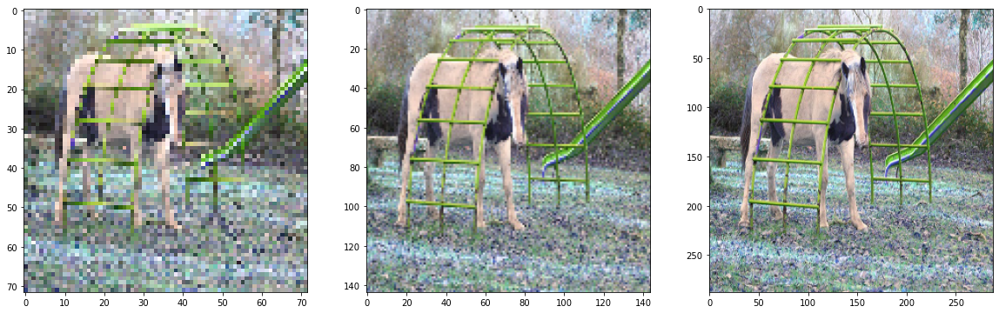

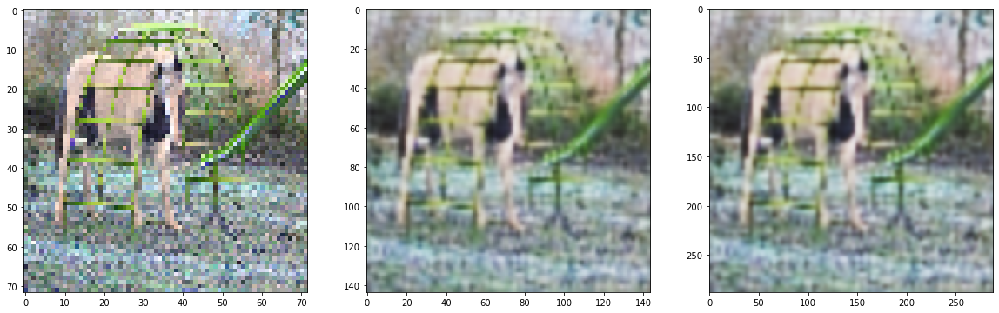

In [20]:
pred = model_v3.predict(X[SPLIT_VAL:])
plot_multiple_images(7, X[SPLIT_VAL:], y_mid[SPLIT_VAL:], y_large[SPLIT_VAL:])
plot_multiple_images(7, X[SPLIT_VAL:], pred[0], pred[1])

# Step 4

## Model v4 - Residual block

In [10]:
rb = 0

def get_res_block(channel):
    global rb
    inp = Input((None, None, channel))
    X = Conv2D(channel,3,activation=LeakyReLU(alpha=0.2), padding='same')(inp)
    X = Conv2D(channel,3,activation=LeakyReLU(alpha=0.2), padding='same')(X)
    X = Add()([X, inp])
    X = Activation(LeakyReLU(alpha=0.2))(X)
    
    rb += 1
    
    return Model(inp, X, name=f'residual_block_{rb}')

In [42]:
def init_model_v4(input_shape):
    inp = Input(input_shape)
    X = Conv2D(32,1,activation=LeakyReLU(alpha=0.2))(inp)
    X = get_res_block(32)(X)
    X = get_res_block(32)(X)
    X = UpSampling2D(2, interpolation='bilinear')(X)
    out1 = Conv2D(3,1,activation='sigmoid', padding='same', name='out_mid')(X)
    X = get_res_block(32)(X)
    X = get_res_block(32)(X)
    X = UpSampling2D(2, interpolation='bilinear')(X)
    out2 = Conv2D(3,1,activation='sigmoid', padding='same', name='out_large')(X)

    model = Model(inp, outputs=[out1, out2])

    model.compile(optimizer='adam', loss='mse')

    return model

In [43]:
model_v4 = init_model_v4(X.shape[1:])
model_v4.summary()

Model: "model_8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_29 (InputLayer)           [(None, 72, 72, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_55 (Conv2D)              (None, 72, 72, 32)   128         input_29[0][0]                   
__________________________________________________________________________________________________
residual_block_1 (Model)        multiple             18496       conv2d_55[0][0]                  
__________________________________________________________________________________________________
residual_block_2 (Model)        multiple             18496       residual_block_1[1][0]           
____________________________________________________________________________________________

In [33]:
model_v4 = init_model_v4(X.shape[1:])
history = model_v4.fit(x=X[:SPLIT_VAL],
                    y=[y_mid[:SPLIT_VAL],y_large[:SPLIT_VAL]],
                    epochs=50,
                    validation_data=(X[SPLIT_VAL:], [y_mid[SPLIT_VAL:],y_large[SPLIT_VAL:]]),
                    callbacks=get_callbacks('model_v4')
                    )

Epoch 1/50
5/5 [==============================] - 1s 139ms/step - loss: 0.1595 - out_mid_loss: 0.0807 - out_large_loss: 0.0788 - val_loss: 0.1461 - val_out_mid_loss: 0.0769 - val_out_large_loss: 0.0692 - lr: 0.0010
Epoch 2/50
5/5 [==============================] - 1s 104ms/step - loss: 0.1361 - out_mid_loss: 0.0754 - out_large_loss: 0.0606 - val_loss: 0.1148 - val_out_mid_loss: 0.0724 - val_out_large_loss: 0.0424 - lr: 0.0010
Epoch 3/50
5/5 [==============================] - 0s 94ms/step - loss: 0.1051 - out_mid_loss: 0.0693 - out_large_loss: 0.0358 - val_loss: 0.0898 - val_out_mid_loss: 0.0622 - val_out_large_loss: 0.0276 - lr: 0.0010
Epoch 4/50
5/5 [==============================] - 1s 101ms/step - loss: 0.0818 - out_mid_loss: 0.0574 - out_large_loss: 0.0244 - val_loss: 0.0678 - val_out_mid_loss: 0.0466 - val_out_large_loss: 0.0212 - lr: 0.0010
Epoch 5/50
5/5 [==============================] - 0s 97ms/step - loss: 0.0582 - out_mid_loss: 0.0408 - out_large_loss: 0.0174 - val_loss: 0.0

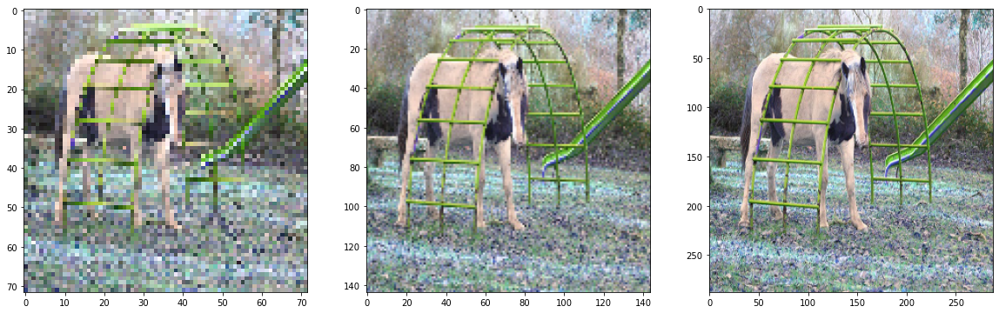

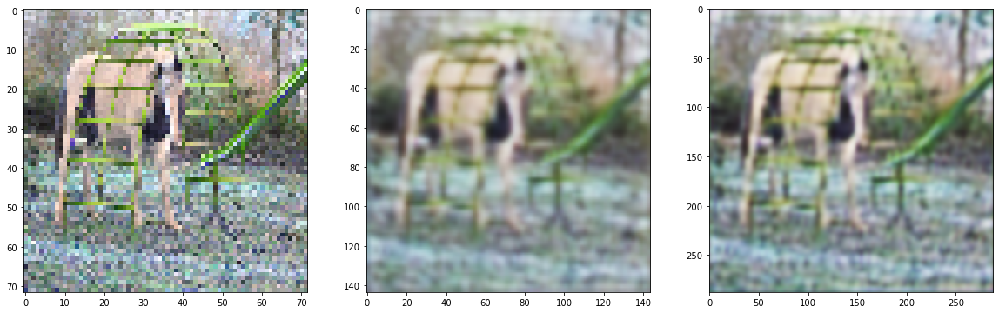

In [34]:
pred = model_v4.predict(X[SPLIT_VAL:])
plot_multiple_images(7, X[SPLIT_VAL:], y_mid[SPLIT_VAL:], y_large[SPLIT_VAL:])
plot_multiple_images(7, X[SPLIT_VAL:], pred[0], pred[1])

# Step 5

## Model v5 - Dialted Convolution

In [6]:
db = 0
def get_dialted_block(channel):
    global db
    inp = Input((None, None, channel))
    d1 = Conv2D(channel,3, dilation_rate=1, activation=LeakyReLU(alpha=0.2), padding='same')(inp)
    d2 = Conv2D(channel,3, dilation_rate=2, activation=LeakyReLU(alpha=0.2), padding='same')(inp)
    d4 = Conv2D(channel,3, dilation_rate=4, activation=LeakyReLU(alpha=0.2), padding='same')(inp)
    X = Concatenate()([d1, d2, d4])
    X = Activation(LeakyReLU(alpha=0.2))(X)
    X = Conv2D(channel, 3, activation=LeakyReLU(alpha=0.2), padding='same')(X)
    
    db +=1
    
    return Model(inp, X, name=f'dialetd_block_{db}')

In [49]:
get_dialted_block(32).summary()

Model: "dialetd_block_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_40 (InputLayer)           [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d_85 (Conv2D)              (None, None, None, 3 9248        input_40[0][0]                   
__________________________________________________________________________________________________
conv2d_86 (Conv2D)              (None, None, None, 3 9248        input_40[0][0]                   
__________________________________________________________________________________________________
conv2d_87 (Conv2D)              (None, None, None, 3 9248        input_40[0][0]                   
____________________________________________________________________________________

In [50]:
def init_model_v5(input_shape):
    inp = Input(input_shape)
    X = Conv2D(32,1,activation=LeakyReLU(alpha=0.2))(inp)
    X = get_dialted_block(32)(X)
    X = get_dialted_block(32)(X)
    X = UpSampling2D(2, interpolation='bilinear')(X)
    out1 = Conv2D(3,1,activation='sigmoid', padding='same', name='out_mid')(X)
    X = get_dialted_block(32)(X)
    X = get_dialted_block(32)(X)
    X = UpSampling2D(2, interpolation='bilinear')(X)
    out2 = Conv2D(3,1,activation='sigmoid', padding='same', name='out_large')(X)

    model = Model(inp, outputs=[out1, out2])

    model.compile(optimizer='adam', loss='mse')

    return model

In [51]:
model_v5 = init_model_v5(X.shape[1:])
model_v5.summary()

Model: "model_10"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_41 (InputLayer)           [(None, 72, 72, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_89 (Conv2D)              (None, 72, 72, 32)   128         input_41[0][0]                   
__________________________________________________________________________________________________
dialetd_block_2 (Model)         multiple             55424       conv2d_89[0][0]                  
__________________________________________________________________________________________________
dialetd_block_3 (Model)         multiple             55424       dialetd_block_2[1][0]            
___________________________________________________________________________________________

In [52]:
model_v5 = init_model_v5(X.shape[1:])
history = model_v5.fit(x=X[:SPLIT_VAL],
                    y=[y_mid[:SPLIT_VAL],y_large[:SPLIT_VAL]],
                    epochs=50,
                    validation_data=(X[SPLIT_VAL:], [y_mid[SPLIT_VAL:],y_large[SPLIT_VAL:]]),
                    callbacks=get_callbacks('model_v5')
                    )

Epoch 1/50
5/5 [==============================] - 2s 338ms/step - loss: 0.1534 - out_mid_loss: 0.0753 - out_large_loss: 0.0781 - val_loss: 0.1471 - val_out_mid_loss: 0.0695 - val_out_large_loss: 0.0775 - lr: 0.0010
Epoch 2/50
5/5 [==============================] - 1s 179ms/step - loss: 0.1284 - out_mid_loss: 0.0615 - out_large_loss: 0.0669 - val_loss: 0.1161 - val_out_mid_loss: 0.0548 - val_out_large_loss: 0.0613 - lr: 0.0010
Epoch 3/50
5/5 [==============================] - 1s 189ms/step - loss: 0.0935 - out_mid_loss: 0.0460 - out_large_loss: 0.0475 - val_loss: 0.0707 - val_out_mid_loss: 0.0348 - val_out_large_loss: 0.0359 - lr: 0.0010
Epoch 4/50
5/5 [==============================] - 1s 182ms/step - loss: 0.0662 - out_mid_loss: 0.0352 - out_large_loss: 0.0310 - val_loss: 0.0558 - val_out_mid_loss: 0.0270 - val_out_large_loss: 0.0288 - lr: 0.0010
Epoch 5/50
5/5 [==============================] - 1s 175ms/step - loss: 0.0514 - out_mid_loss: 0.0245 - out_large_loss: 0.0268 - val_loss: 0

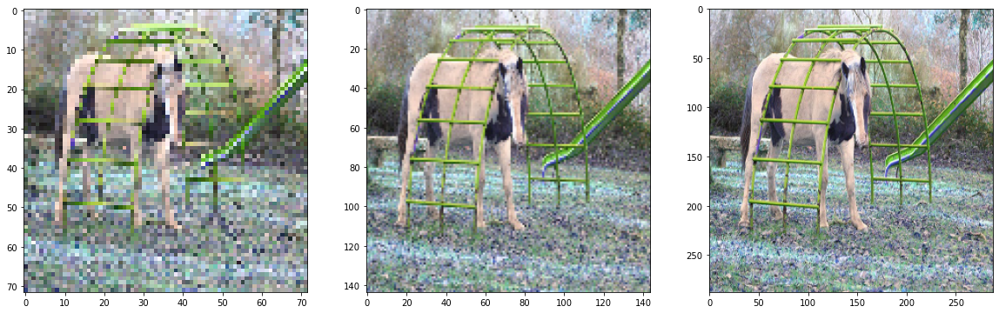

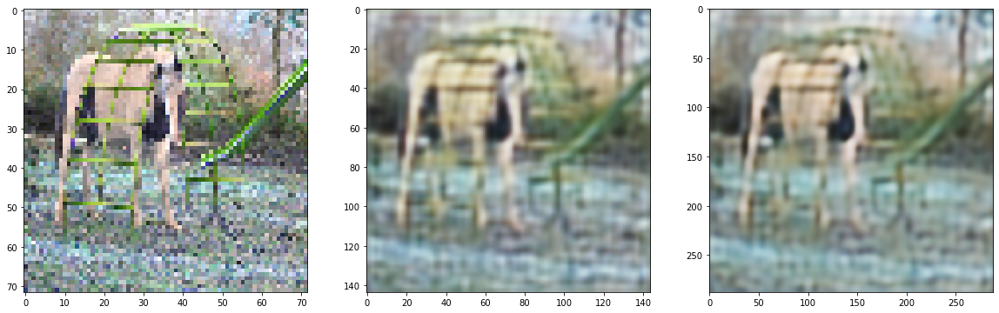

In [54]:
pred = model_v5.predict(X[SPLIT_VAL:])
plot_multiple_images(7, X[SPLIT_VAL:], y_mid[SPLIT_VAL:], y_large[SPLIT_VAL:])
plot_multiple_images(7, X[SPLIT_VAL:], pred[0], pred[1])

# Step 6

## Model v6 - Pretrained Network

Need preprocess diffrently 
https://www.tensorflow.org/api_docs/python/tf/keras/applications/imagenet_utils/preprocess_input
https://github.com/tensorflow/tensorflow/blob/v2.4.0/tensorflow/python/keras/applications/imagenet_utils.py#L103-L119

In [156]:
def vgg_preprocess(x):
#     mean = [103.939, 116.779, 123.68]
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]
    x[..., 0] -= mean[0]
    x[..., 1] -= mean[1]
    x[..., 2] -= mean[2]
    
    x[..., 0] /= std[0]
    x[..., 1] /= std[1]
    x[..., 2] /= std[2]
    
    return x

In [157]:
def vgg_decode(x):
#     mean = [103.939, 116.779, 123.68]
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]
    
    x[..., 0] += mean[0]
    x[..., 1] += mean[1]
    x[..., 2] += mean[2]
    
    x[..., 0] *= std[0]
    x[..., 1] *= std[1]
    x[..., 2] *= std[2]
    
    return x

In [158]:
X_vgg = vgg_preprocess(X*1.)
y_mid_vgg = vgg_preprocess(y_mid*1.)
y_large_vgg = vgg_preprocess(y_large*1.)

In [7]:
fe = 0

def get_feature_extractor_vgg16(channel):
    global fe
    inp = Input((None, None, channel))
    vgg = VGG16(input_tensor=inp, include_top=False)
    vgg_layers = vgg.layers[:3]
    for layer in vgg_layers:
        vgg.trainable = False
        
    fe += 1
    
    return Model(vgg_layers[0].input, vgg_layers[-1].output, name=f'vgg_fe_{fe}')

In [172]:
def init_model_v6(input_shape):
    inp = Input(input_shape)
    
    X = Conv2D(64,3,activation=LeakyReLU(alpha=0.2), padding='same')(inp)
    X = Conv2D(64,3,activation=LeakyReLU(alpha=0.2), padding='same')(X)
    
    FE = get_feature_extractor_vgg16(inp.shape[3])(inp)
    
    X = Concatenate()([X, FE])
    
    X = UpSampling2D(2, interpolation='bilinear')(X)
    
    out1 = Conv2D(3,1,activation='sigmoid', name='out_mid')(X)

    X = UpSampling2D(2, interpolation='bilinear')(X)
    out2 = Conv2D(3,1,activation='sigmoid', name='out_large')(X)

    model = Model(inp, outputs=[out1, out2])

    model.compile(optimizer='adam', loss='mse')

    return model

In [173]:
model_v6 = init_model_v6(X.shape[1:])
model_v6.summary()

Model: "model_23"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_75 (InputLayer)           [(None, 72, 72, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_147 (Conv2D)             (None, 72, 72, 64)   1792        input_75[0][0]                   
__________________________________________________________________________________________________
conv2d_148 (Conv2D)             (None, 72, 72, 64)   36928       conv2d_147[0][0]                 
__________________________________________________________________________________________________
vgg_fe_12 (Model)               multiple             38720       input_75[0][0]                   
___________________________________________________________________________________________

In [178]:
model_v6 = init_model_v6(X.shape[1:])
history = model_v6.fit(x=X[:SPLIT_VAL],
                    y=[y_mid[:SPLIT_VAL],y_large[:SPLIT_VAL]],
                    epochs=50,
                    validation_data=(X[SPLIT_VAL:], [y_mid[SPLIT_VAL:],y_large[SPLIT_VAL:]]),
                    callbacks=get_callbacks('model_v6')
                    )

Epoch 1/50
5/5 [==============================] - 1s 135ms/step - loss: 0.3930 - out_mid_loss: 0.2323 - out_large_loss: 0.1607 - val_loss: 0.3499 - val_out_mid_loss: 0.2088 - val_out_large_loss: 0.1411 - lr: 0.0010
Epoch 2/50
5/5 [==============================] - 1s 115ms/step - loss: 0.3290 - out_mid_loss: 0.1985 - out_large_loss: 0.1305 - val_loss: 0.2836 - val_out_mid_loss: 0.1760 - val_out_large_loss: 0.1076 - lr: 0.0010
Epoch 3/50
5/5 [==============================] - 1s 121ms/step - loss: 0.2484 - out_mid_loss: 0.1626 - out_large_loss: 0.0859 - val_loss: 0.1936 - val_out_mid_loss: 0.1327 - val_out_large_loss: 0.0609 - lr: 0.0010
Epoch 4/50
5/5 [==============================] - 1s 112ms/step - loss: 0.1759 - out_mid_loss: 0.1157 - out_large_loss: 0.0603 - val_loss: 0.1675 - val_out_mid_loss: 0.1059 - val_out_large_loss: 0.0616 - lr: 0.0010
Epoch 5/50
5/5 [==============================] - 1s 130ms/step - loss: 0.1559 - out_mid_loss: 0.1018 - out_large_loss: 0.0541 - val_loss: 0

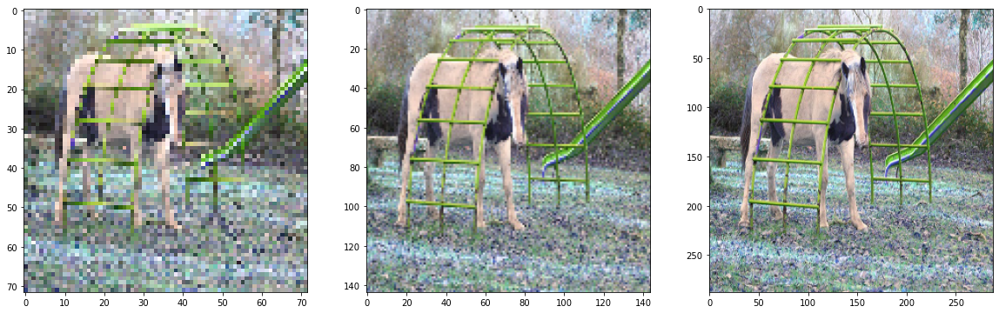

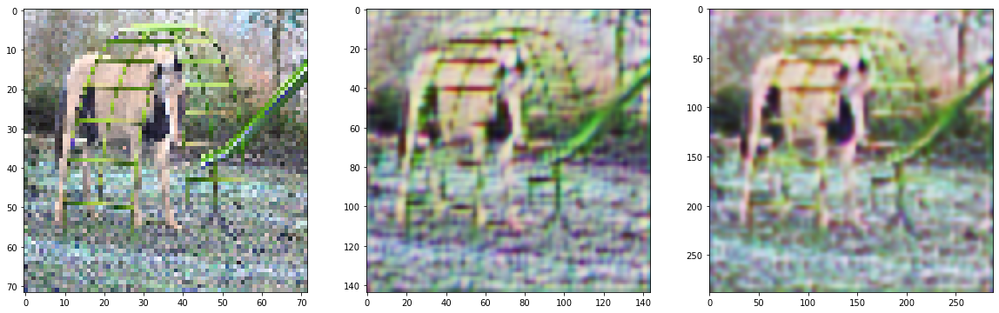

In [179]:
pred = model_v6.predict(X[SPLIT_VAL:])
plot_multiple_images(7, X[SPLIT_VAL:], y_mid[SPLIT_VAL:], y_large[SPLIT_VAL:])
plot_multiple_images(7, X[SPLIT_VAL:], pred[0], pred[1])

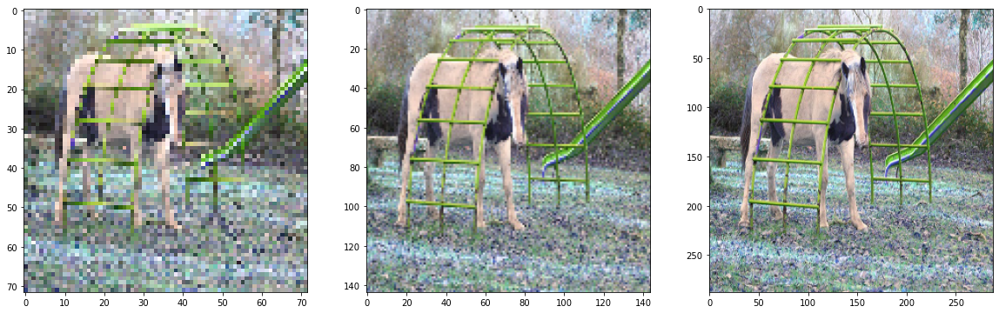

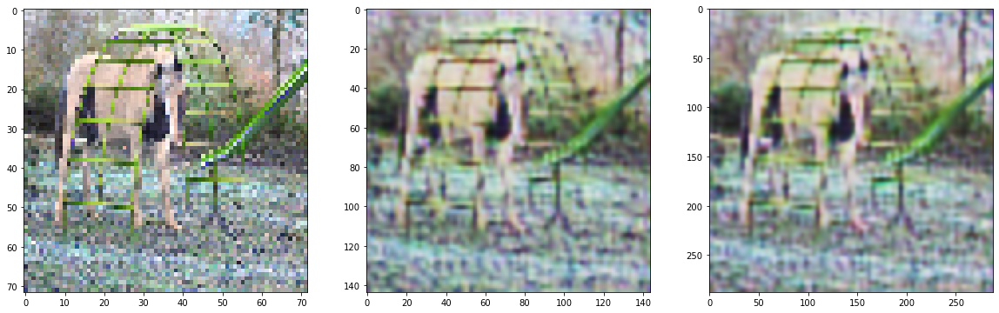

In [166]:
pred = model_v6.predict(X[SPLIT_VAL:])
plot_multiple_images(7, X[SPLIT_VAL:], y_mid[SPLIT_VAL:], y_large[SPLIT_VAL:])
plot_multiple_images(7, X[SPLIT_VAL:], pred[0], pred[1])

# Step 7

## Model v7 - Depth to Space

In [182]:
def init_model_v7(input_shape):
    inp = Input(input_shape)
    
    X = Conv2D(64,3,activation=LeakyReLU(alpha=0.2), padding='same')(inp)
    X = Conv2D(64,3,activation=LeakyReLU(alpha=0.2), padding='same')(X)
    
    FE = get_feature_extractor_vgg16(inp.shape[3])(inp)
    
    X = Concatenate()([X, FE])
    
    X = depth_to_space(X, 2)
    
    out1 = Conv2D(3,1,activation='sigmoid', name='out_mid')(X)

    X = depth_to_space(X, 2)
    out2 = Conv2D(3,1,activation='sigmoid', name='out_large')(X)

    model = Model(inp, outputs=[out1, out2])

    model.compile(optimizer='adam', loss='mse')

    return model

In [183]:
model_v7 = init_model_v7(X.shape[1:])
model_v7.summary()

Model: "model_27"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_85 (InputLayer)           [(None, 72, 72, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_157 (Conv2D)             (None, 72, 72, 64)   1792        input_85[0][0]                   
__________________________________________________________________________________________________
conv2d_158 (Conv2D)             (None, 72, 72, 64)   36928       conv2d_157[0][0]                 
__________________________________________________________________________________________________
vgg_fe_16 (Model)               multiple             38720       input_85[0][0]                   
___________________________________________________________________________________________

In [184]:
model_v7 = init_model_v7(X.shape[1:])
history = model_v7.fit(x=X[:SPLIT_VAL],
                    y=[y_mid[:SPLIT_VAL],y_large[:SPLIT_VAL]],
                    epochs=50,
                    validation_data=(X[SPLIT_VAL:], [y_mid[SPLIT_VAL:],y_large[SPLIT_VAL:]]),
                    callbacks=get_callbacks('model_v7')
                    )

Epoch 1/50
5/5 [==============================] - 0s 74ms/step - loss: 0.3112 - out_mid_loss: 0.1591 - out_large_loss: 0.1521 - val_loss: 0.3070 - val_out_mid_loss: 0.1562 - val_out_large_loss: 0.1508 - lr: 0.0010
Epoch 2/50
5/5 [==============================] - 0s 58ms/step - loss: 0.3023 - out_mid_loss: 0.1523 - out_large_loss: 0.1501 - val_loss: 0.2982 - val_out_mid_loss: 0.1496 - val_out_large_loss: 0.1486 - lr: 0.0010
Epoch 3/50
5/5 [==============================] - 0s 49ms/step - loss: 0.2935 - out_mid_loss: 0.1456 - out_large_loss: 0.1479 - val_loss: 0.2892 - val_out_mid_loss: 0.1427 - val_out_large_loss: 0.1465 - lr: 0.0010
Epoch 4/50
5/5 [==============================] - 0s 55ms/step - loss: 0.2843 - out_mid_loss: 0.1385 - out_large_loss: 0.1458 - val_loss: 0.2790 - val_out_mid_loss: 0.1348 - val_out_large_loss: 0.1442 - lr: 0.0010
Epoch 5/50
5/5 [==============================] - 0s 43ms/step - loss: 0.2744 - out_mid_loss: 0.1308 - out_large_loss: 0.1436 - val_loss: 0.2681

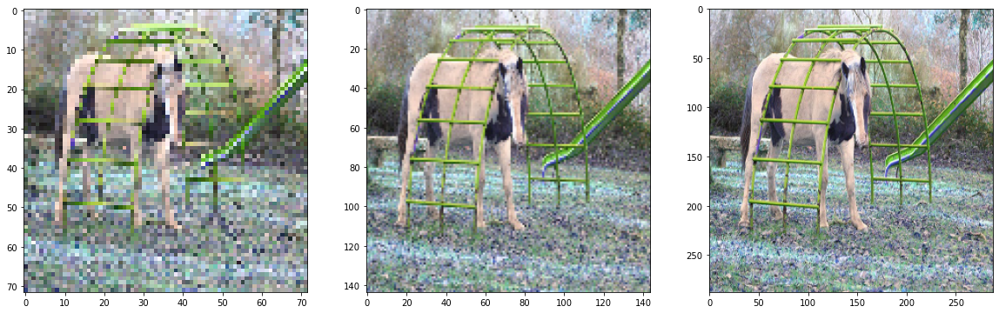

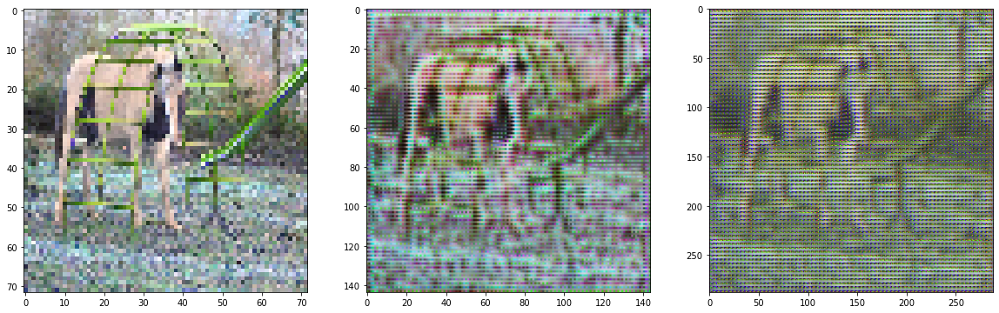

In [185]:
pred = model_v7.predict(X[SPLIT_VAL:])
plot_multiple_images(7, X[SPLIT_VAL:], y_mid[SPLIT_VAL:], y_large[SPLIT_VAL:])
plot_multiple_images(7, X[SPLIT_VAL:], pred[0], pred[1])

# Step 8

## Creating custom callbacks

In [231]:
class SaveProgress(Callback):
    
    
    def __init__(self, validation_data):
        self.preds_container = []
        self.validation_data = validation_data
    
    def on_epoch_end(self, epoch, logs=None):
        self.preds_container += [self.model.predict(self.validation_data)]

In [232]:
save_progress_cb = SaveProgress(X[SPLIT_VAL:])

model_v7 = init_model_v7(X.shape[1:])
history = model_v7.fit(x=X[:SPLIT_VAL],
                    y=[y_mid[:SPLIT_VAL],y_large[:SPLIT_VAL]],
                    epochs=50,
                    validation_data=(X[SPLIT_VAL:], [y_mid[SPLIT_VAL:],y_large[SPLIT_VAL:]]),
                    callbacks=[save_progress_cb] + get_callbacks('model_v7')
                    )

Epoch 1/50
5/5 [==============================] - 0s 95ms/step - loss: 0.2900 - out_mid_loss: 0.1499 - out_large_loss: 0.1401 - val_loss: 0.2841 - val_out_mid_loss: 0.1461 - val_out_large_loss: 0.1380 - lr: 0.0010
Epoch 2/50
5/5 [==============================] - 0s 67ms/step - loss: 0.2799 - out_mid_loss: 0.1420 - out_large_loss: 0.1379 - val_loss: 0.2745 - val_out_mid_loss: 0.1386 - val_out_large_loss: 0.1359 - lr: 0.0010
Epoch 3/50
5/5 [==============================] - 0s 63ms/step - loss: 0.2706 - out_mid_loss: 0.1347 - out_large_loss: 0.1359 - val_loss: 0.2649 - val_out_mid_loss: 0.1308 - val_out_large_loss: 0.1341 - lr: 0.0010
Epoch 4/50
5/5 [==============================] - 0s 63ms/step - loss: 0.2612 - out_mid_loss: 0.1273 - out_large_loss: 0.1339 - val_loss: 0.2546 - val_out_mid_loss: 0.1228 - val_out_large_loss: 0.1317 - lr: 0.0010
Epoch 5/50
5/5 [==============================] - 0s 67ms/step - loss: 0.2516 - out_mid_loss: 0.1200 - out_large_loss: 0.1316 - val_loss: 0.2440

In [241]:
save_progress_cb.preds_container[0][0].shape

(40, 144, 144, 3)

In [267]:
rc('animation', html='html5')

In [268]:
anim

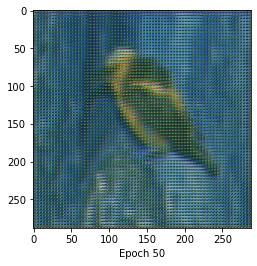

In [273]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt

from matplotlib import animation, rc
# from IPython.display import HTML

rc('animation', html='html5')

fig, ax = plt.subplots()

frames = len(save_progress_cb.preds_container)
pic = 34

def init():
    ax_image =ax.imshow(save_progress_cb.preds_container[0][1][pic])
    ax.set_xlabel(f'Epoch 1')
    return (ax_image,)

def animate(i):
    ax_image = ax.imshow(save_progress_cb.preds_container[i][1][pic])
    label = f'Epoch {i+1}'
    ax.set_xlabel(label)
    return (ax_image,)

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=frames, interval=100, blit=True)

# HTML(anim.to_html5_video())
anim

# Final version

In [211]:
def init_model_v10(input_shape):
    inp = Input(input_shape)
    
    X = Conv2D(64,3,activation=LeakyReLU(alpha=0.2), padding='same')(inp)
    X = Conv2D(64,3,activation=LeakyReLU(alpha=0.2), padding='same')(X)
    
    X = get_res_block(64)(X)
    X = get_dialted_block(64)(X)
    X = get_res_block(64)(X)
    X = get_dialted_block(64)(X)
    X = get_res_block(64)(X)
    X = get_dialted_block(64)(X)
    
    FE = get_feature_extractor_vgg16(inp.shape[3])(inp)
    
    X = Concatenate()([X, FE])
    X = Conv2D(64,3,activation=LeakyReLU(alpha=0.2), padding='same')(X)
    
    X = get_res_block(64)(X)
    X = get_dialted_block(64)(X)
    X = get_res_block(64)(X)
    X = get_dialted_block(64)(X)
    X = get_res_block(64)(X)
    X = get_dialted_block(64)(X)
    
    X = UpSampling2D(2, interpolation='bilinear')(X)
    
    out1 = Conv2D(3,1,activation='sigmoid', name='out_mid')(X)


    X = UpSampling2D(2, interpolation='bilinear')(X)
    out2 = Conv2D(3,1,activation='sigmoid', name='out_large')(X)

    model = Model(inp, outputs=[out1, out2])

    model.compile(optimizer='adam', loss='mse')

    return model

In [212]:
model_v10 = init_model_v10(X.shape[1:])
model_v10.summary()

Model: "model_43"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_201 (InputLayer)          [(None, 72, 72, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_453 (Conv2D)             (None, 72, 72, 64)   1792        input_201[0][0]                  
__________________________________________________________________________________________________
conv2d_454 (Conv2D)             (None, 72, 72, 64)   36928       conv2d_453[0][0]                 
__________________________________________________________________________________________________
residual_block_47 (Model)       multiple             73856       conv2d_454[0][0]                 
___________________________________________________________________________________________

In [213]:
model_v10 = init_model_v10(X.shape[1:])
history = model_v10.fit(x=X[:SPLIT_VAL],
                    y=[y_mid[:SPLIT_VAL],y_large[:SPLIT_VAL]],
                    epochs=50,
                    validation_data=(X[SPLIT_VAL:], [y_mid[SPLIT_VAL:],y_large[SPLIT_VAL:]]),
                    callbacks=get_callbacks('model_v10')
                    )

Epoch 1/50
5/5 [==============================] - 3s 576ms/step - loss: 0.3138 - out_mid_loss: 0.1682 - out_large_loss: 0.1457 - val_loss: 0.1574 - val_out_mid_loss: 0.0775 - val_out_large_loss: 0.0799 - lr: 0.0010
Epoch 2/50
5/5 [==============================] - 1s 290ms/step - loss: 0.1912 - out_mid_loss: 0.1005 - out_large_loss: 0.0908 - val_loss: 0.1596 - val_out_mid_loss: 0.0861 - val_out_large_loss: 0.0735 - lr: 0.0010
Epoch 3/50
5/5 [==============================] - 2s 346ms/step - loss: 0.1542 - out_mid_loss: 0.0775 - out_large_loss: 0.0767 - val_loss: 0.1370 - val_out_mid_loss: 0.0696 - val_out_large_loss: 0.0674 - lr: 0.0010
Epoch 4/50
5/5 [==============================] - 2s 351ms/step - loss: 0.1460 - out_mid_loss: 0.0753 - out_large_loss: 0.0708 - val_loss: 0.1074 - val_out_mid_loss: 0.0521 - val_out_large_loss: 0.0552 - lr: 0.0010
Epoch 5/50
5/5 [==============================] - 1s 294ms/step - loss: 0.1090 - out_mid_loss: 0.0556 - out_large_loss: 0.0534 - val_loss: 0

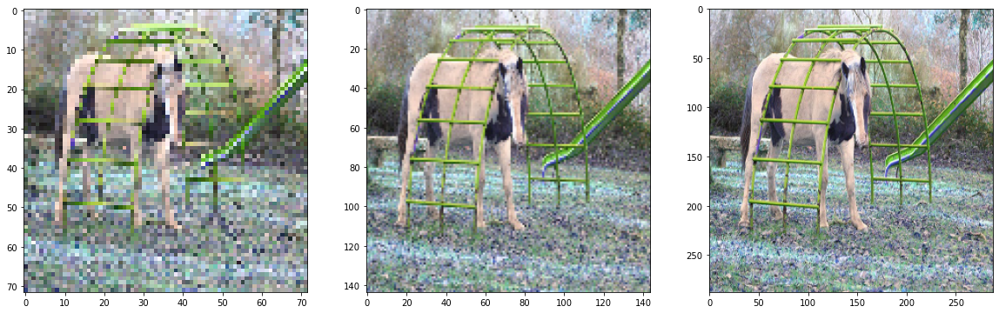

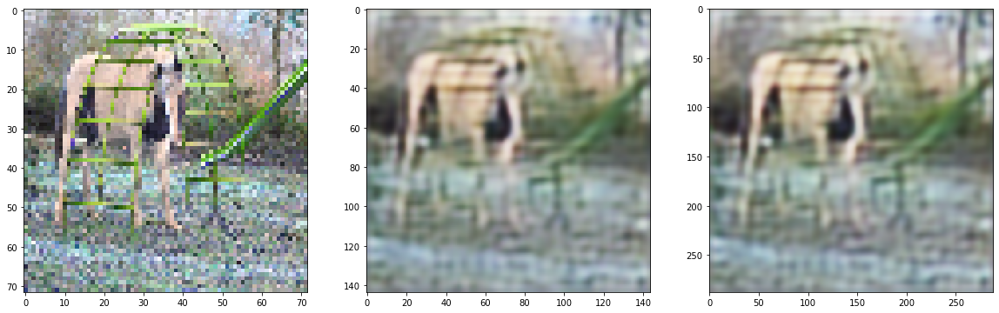

In [214]:
pred = model_v10.predict(X[SPLIT_VAL:])
plot_multiple_images(7, X[SPLIT_VAL:], y_mid[SPLIT_VAL:], y_large[SPLIT_VAL:])
plot_multiple_images(7, X[SPLIT_VAL:], pred[0], pred[1])

In [12]:
def init_model_v11(input_shape):
    inp = Input(input_shape)
    
    X = Conv2D(64,1,activation=LeakyReLU(alpha=0.2), padding='same')(inp)
    
    X = get_res_block(64)(X)
    X = get_dialted_block(64)(X)

    
    FE = get_feature_extractor_vgg16(inp.shape[3])(inp)
    
    X = Concatenate()([X, FE])
    X = Conv2D(64,3,activation=LeakyReLU(alpha=0.2), padding='same')(X)


    X = get_res_block(64)(X)
    X = get_dialted_block(64)(X)
    
    X = UpSampling2D(2, interpolation='bilinear')(X)
    
    out1 = Conv2D(3,1,activation='sigmoid', name='out_mid')(X)


    X = UpSampling2D(2, interpolation='bilinear')(X)
    out2 = Conv2D(3,1,activation='sigmoid', name='out_large')(X)

    model = Model(inp, outputs=[out1, out2])

    model.compile(optimizer='adam', loss='mse')

    return model

In [ ]:
model_v11 = init_model_v11(X.shape[1:])
history = model_v11.fit(x=X[:SPLIT_VAL],
                    y=[y_mid[:SPLIT_VAL],y_large[:SPLIT_VAL]],
                    epochs=100,
                    validation_data=(X[SPLIT_VAL:], [y_mid[SPLIT_VAL:],y_large[SPLIT_VAL:]]),
                    callbacks=get_callbacks('model_v11_5000')
                    )

In [12]:
model_v11 = load_model('./models/model_v11_5000.h5', custom_objects={'LeakyReLU': LeakyReLU})

In [13]:
pred = model_v11.predict(X[SPLIT_VAL:])

In [23]:
t_pred = model_v11.predict(test_X)

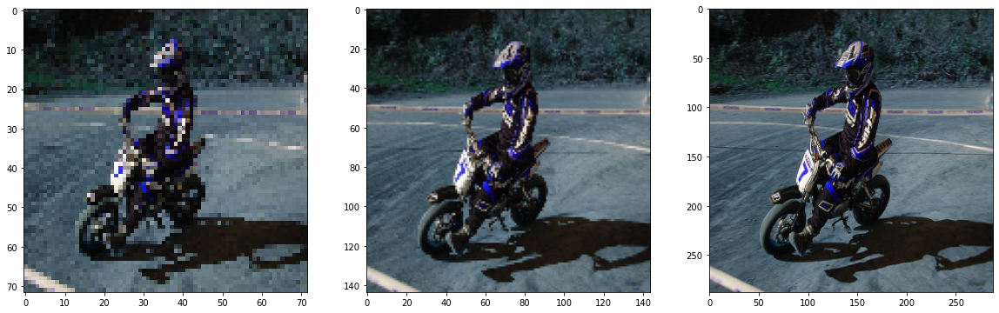

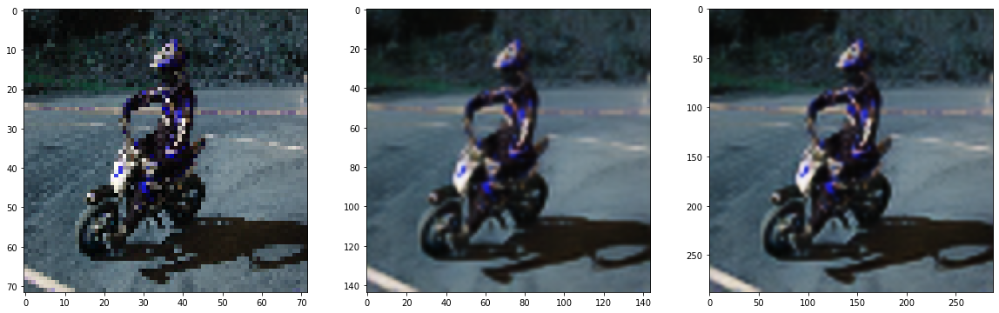

In [28]:
plot_multiple_images(0, test_X, test_y_mid, test_y_large)
plot_multiple_images(0, test_X, t_pred[0], t_pred[1])

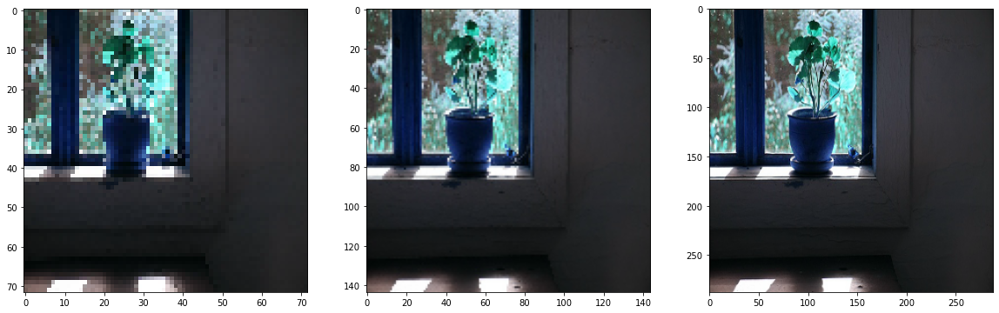

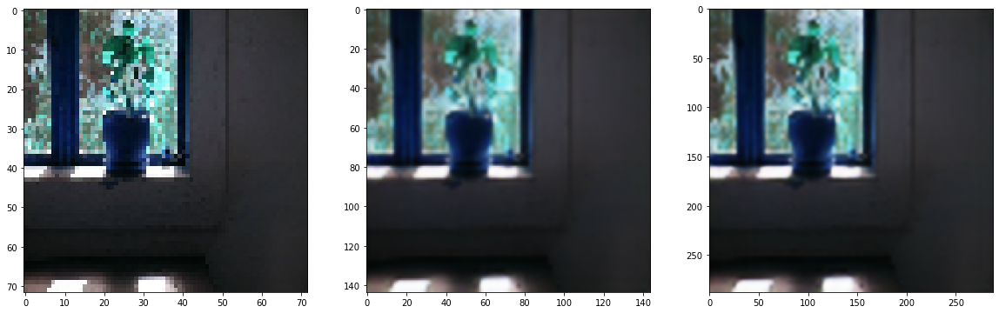

In [16]:
plot_multiple_images(42, X[SPLIT_VAL:], y_mid[SPLIT_VAL:], y_large[SPLIT_VAL:])
plot_multiple_images(42, X[SPLIT_VAL:], pred[0], pred[1])

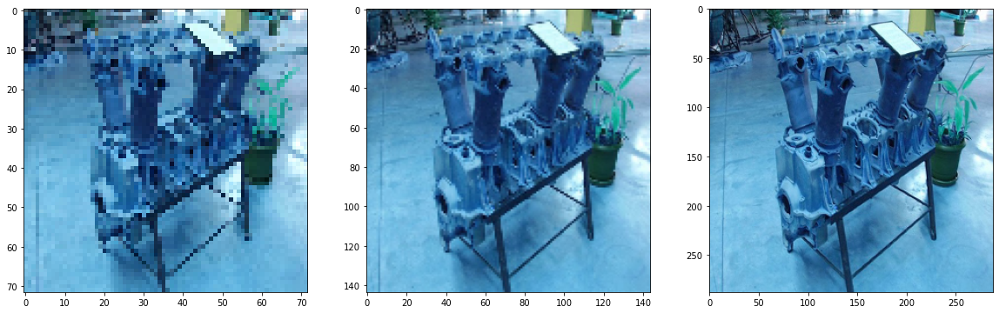

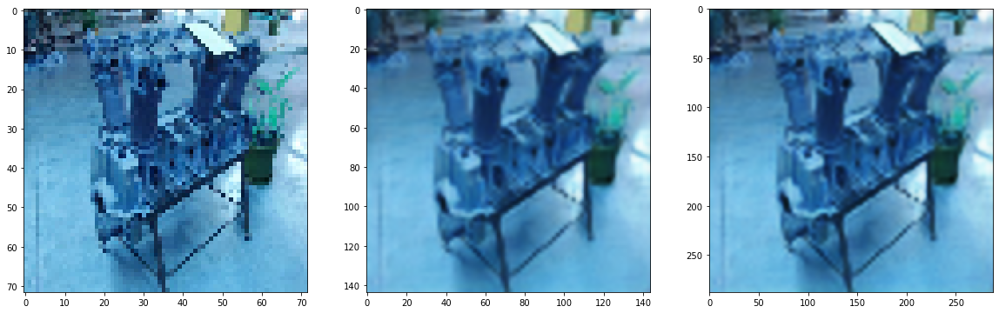

In [20]:
plot_multiple_images(100, X[SPLIT_VAL:], y_mid[SPLIT_VAL:], y_large[SPLIT_VAL:])
plot_multiple_images(100, X[SPLIT_VAL:], pred[0], pred[1])

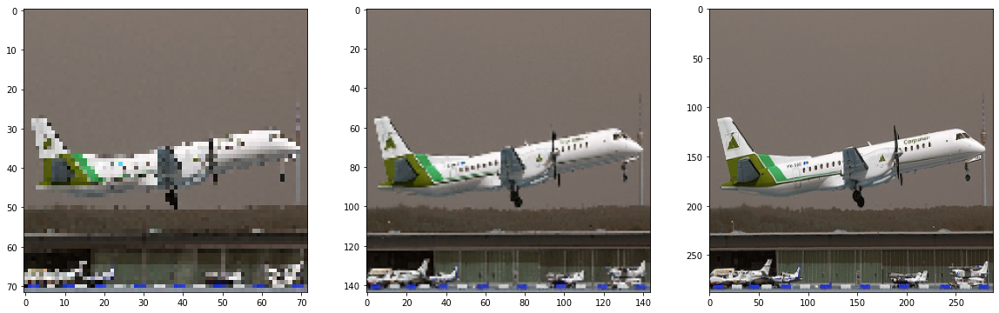

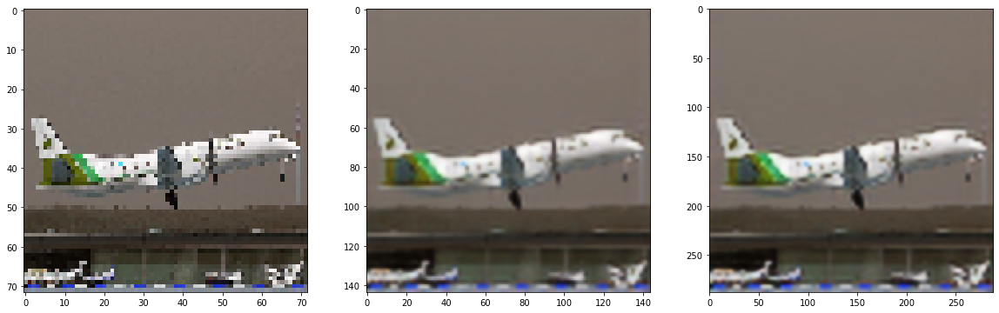

In [21]:
plot_multiple_images(555, X[SPLIT_VAL:], y_mid[SPLIT_VAL:], y_large[SPLIT_VAL:])
plot_multiple_images(555, X[SPLIT_VAL:], pred[0], pred[1])

# 200

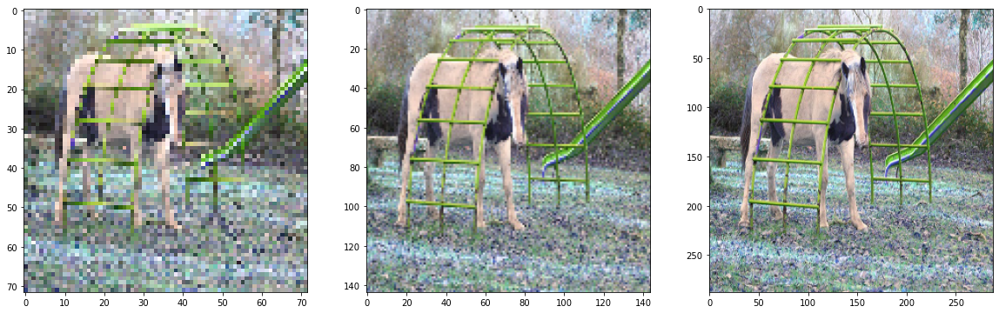

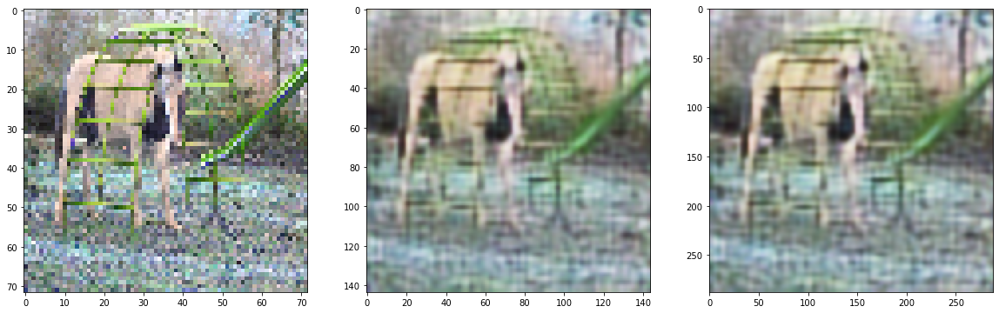

In [222]:
pred = model_v11.predict(X[SPLIT_VAL:])
plot_multiple_images(7, X[SPLIT_VAL:], y_mid[SPLIT_VAL:], y_large[SPLIT_VAL:])
plot_multiple_images(7, X[SPLIT_VAL:], pred[0], pred[1])

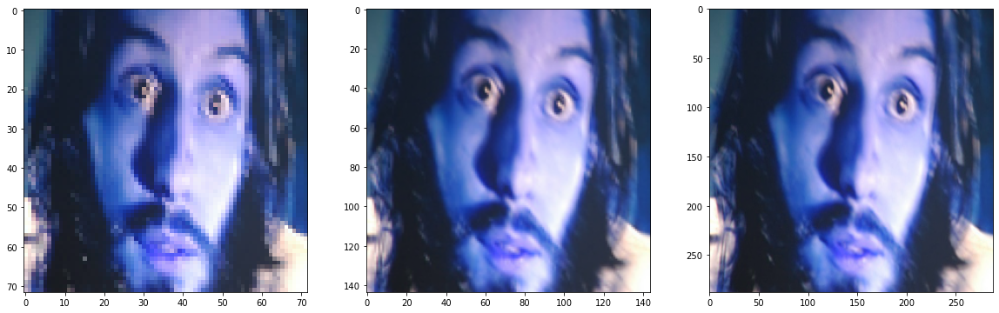

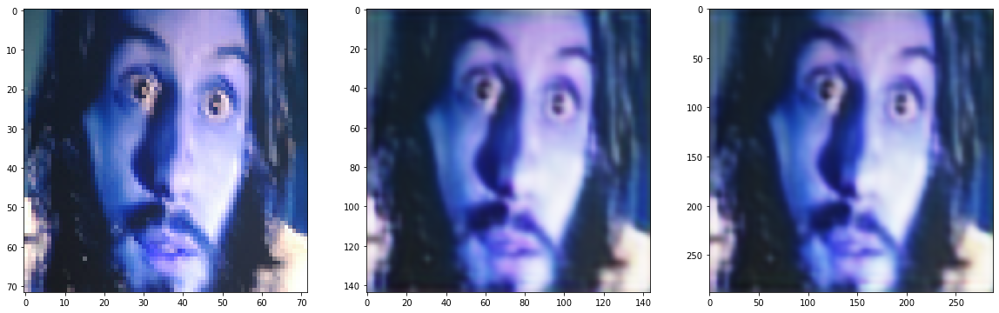

In [221]:
pred = model_v11.predict(X[SPLIT_VAL:])
plot_multiple_images(1, X[SPLIT_VAL:], y_mid[SPLIT_VAL:], y_large[SPLIT_VAL:])
plot_multiple_images(1, X[SPLIT_VAL:], pred[0], pred[1])

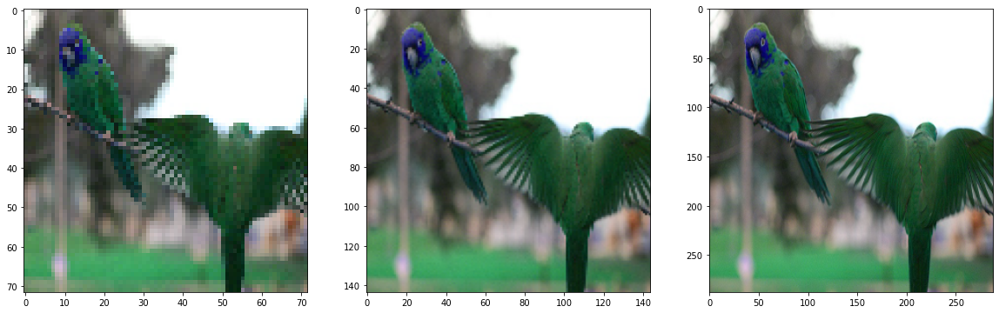

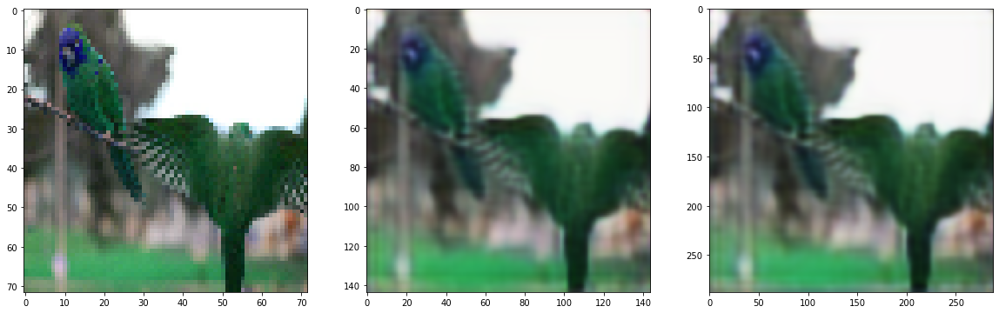

In [230]:
pred = model_v11.predict(X[SPLIT_VAL:])
plot_multiple_images(21, X[SPLIT_VAL:], y_mid[SPLIT_VAL:], y_large[SPLIT_VAL:])
plot_multiple_images(21, X[SPLIT_VAL:], pred[0], pred[1])